# FYP playground
fyp2020-0308

---

Imports

In [1]:
# imports
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import math
import os
import pandas as pd
import seaborn as sns

from matplotlib import cm
from PIL import Image
import skimage
from skimage import morphology

%run -i ../scripts/fyp2021p3_group08_functions.py

## 1.1 Explore an image
<br>
- Use matplotlib.pyplot package to load an image and the corresponding segmentation. Display the images side by side (as subplots)<br>
– Inspect the dimensions and values inside the images, what do you notice?<br>
– How can you use the mask to measure the width or height of the skin lesion
at different points in the image? Can you now find the maximum width and
height? What about finding the maximum possible diameter of the lesion?<br>
– Use the segmentation to mask out / erase the outside of the skin lesion. Can
you do this without a for loop?<br>
– Try to extract the color of a single pixel inside the lesion, and store this
color. Can you now fill the entire lesion, just with this color?<br>

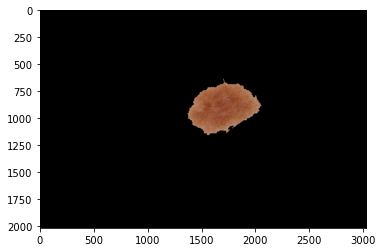

In [4]:
def image_segmentation(original, segmentation):
    """takes an image and the corresponding segmentation and returns the image "masked" to only show the lesion"""
    ori_img = plt.imread(original)
    seg_img = plt.imread(segmentation)

    segmented_image = ori_img.copy()
    segmented_image[seg_img==0] = 0

    return segmented_image

example = image_segmentation('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')
plt.imshow(example)

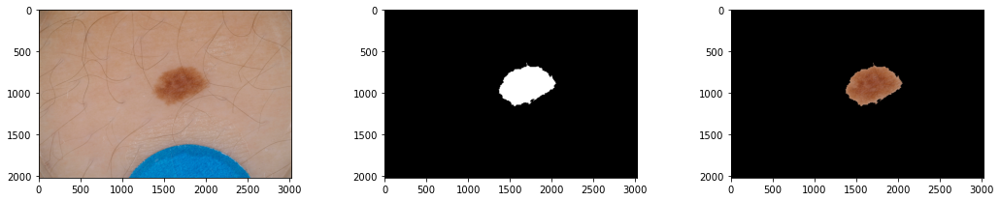

In [3]:
# function for the above
def subplotting_images(original, segmentation):
    ori_img = plt.imread(original)
    seg_img = plt.imread(segmentation)
    img_seg = image_segmentation(original, segmentation)
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 3))
    axes[0].imshow(ori_img)
    axes[1].imshow(seg_img, cmap='gray')
    axes[2].imshow(image_segmentation(original, segmentation))
    return fig.tight_layout()

subplotting_images('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')

Measuring parts in the mask

total size of image: 6096384
size of mask: 216160.0
area ask % of total: 3.545708406819518


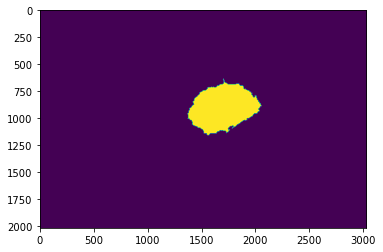

In [10]:
total = mask.shape[0] * mask.shape[1]
print("total size of image:", total)

area = np.sum(mask)
print("size of mask:", area)

area_pct = area/total*100
print("area ask % of total:", area_pct)

plt.imshow(mask)

In [11]:
pixels_in_col = np.sum(mask, axis=0)
print("number of pixels in each coloumn:", pixels_in_col)
print("max height in column:", max(np.sum(mask, axis=0)))

pixels_in_row = np.sum(mask, axis=1)
print("number of pixels in each row:", pixels_in_row)
print("max height in row:", max(np.sum(mask, axis=1)))

number of pixels in each coloumn: [0. 0. 0. ... 0. 0. 0.]
max height in column: 469.0
number of pixels in each row: [0. 0. 0. ... 0. 0. 0.]
max height in row: 655.0


In [12]:
not_zero_col = []
for i in pixels_in_col:
    if i > 0:
        not_zero_col.append(i)

print("number of columns with more than zero pixels:", len(not_zero_col))

not_zero_row = []
for i in pixels_in_row:
    if i > 0:
        not_zero_row.append(i)

print("number of rows with more than zero pixels:", len(not_zero_row))

number of columns with more than zero pixels: 688
number of rows with more than zero pixels: 521


# Color of lesion
Measuring <b>color of lesion. </b> <br>
First, finding the pixels of the lesion: <code>color_of_image</code> or <code>measure_color[0]</code>. <br>
Second, finding the most dominant colour among the pixels just found: <code>dominant_colors</code> or <code>measure_color[3)</code> <br>
Third, finding the average of all pixels in the lesion: <code> average_color</code> or <code>measure_color[4]</code> <br>

In [5]:
# ALL IN ONE
def measure_color(original, segmentation):
    """Takes the original and the segmentation file
    returns: 
    [0] the rgb value of all pixels with count of each unique value in sorted order
    [1] the total of pixels the lesion make uo
    [2] the number of unique RGB-values in the lesion
    [3] the five most dominant colors
    [4] the total RGB-value average of the lesion
    [5:8] the standard deviation of r, g and d individually
    """
    # getting the "masked" image and transforming it from array to Image
    image = Image.fromarray(image_segmentation(original, segmentation).astype('uint8'), 'RGB')
    
    # all colors in lesion
    width, height = image.size
    pixels = image.getcolors(width*height) # getting the colors of the shape of the image
    sorted_pixels = sorted(pixels, key=lambda t: t[0], reverse=True) # sorting found pixels by count (ascending)
    colors = sorted_pixels[1:] # ignoring the first colour, as it is just the background (black / white)
    
    # 5 dominant colors of lesion
    rgb_values = [list(i[1]) for i in colors] # without the "key"
    dominant_colors = rgb_values[0:5]
    
    # average color of lesion
    r_values = [i[0] for i in rgb_values] # assigning each r, g and b to own list
    g_values = [i[1] for i in rgb_values]
    b_values = [i[2] for i in rgb_values]
    
    r_average = int(sum(r_values)/len(r_values)) # taking average of each of those lists
    g_average = int(sum(g_values)/len(g_values))
    b_average = int(sum(b_values)/len(b_values))
    coloraverage = [r_average, g_average, b_average]
    
    # finding total of pixels the lesion make up
    lesion_pixels = [i[0] for i in colors] # taking the "key" from the found colors
    total_lesion_pixels = sum(lesion_pixels) # adding the "keys" together
    
    # finding the standard deviation of r, g and b
    r_std = np.std(r_values) # referring back to the previous made list of r, g and b individually
    g_std = np.std(g_values)
    b_std = np.std(b_values)
    
    return colors, total_lesion_pixels, len(colors), dominant_colors, coloraverage, r_std, g_std, b_std

measure_color('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')[0]
measure_color('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')[1]
measure_color('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')[2]
measure_color('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')[3]
measure_color('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')[4]

[157, 97, 67]

In [9]:
measure_color('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')[5]

16.644739051011157

In [6]:
# https://stackoverflow.com/questions/3380726/converting-a-rgb-color-tuple-to-a-six-digit-code-in-python
# RGB-value to hex-value for plotting the points with the colour corresponding to the value of the point

def rgb2hex(r,g,b):
    return "#{:02x}{:02x}{:02x}".format(r,g,b)

rgb2hex(157, 97, 67)

'#9d6143'

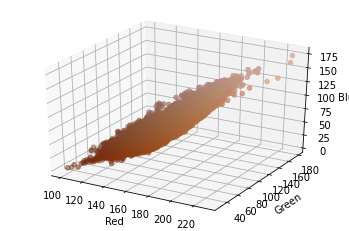

101 229
29 178
4 174


In [7]:
# https://gist.github.com/Uberi/4885a318e7ef2afa7f22

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import pyplot

fig = pyplot.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d") # 3D plot with scalar values in each axis

#here = image_segmentation('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')
colors = measure_color('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')[0]
rgb = [list(i[1]) for i in colors]

r = [i[0] for i in rgb]
g = [i[1] for i in rgb]
b = [i[2] for i in rgb]

r_min, r_max = min(r), max(r)
g_min, g_max = min(g), max(g)
b_min, b_max = min(b), max(b)

ashex_list = []

for i in rgb:
    rr = i[0]
    gg = i[1]
    bb = i[2]
    ashex = ashex_list.append(rgb2hex(rr, gg, bb))

axis.scatter(r, g, b, c=ashex_list, marker="o")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
pyplot.show()

print(r_min, r_max)
print(g_min, g_max)
print(b_min, b_max)

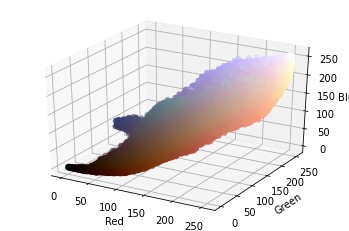

0 255
0 255
0 255


In [10]:
fig = pyplot.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d") # 3D plot with scalar values in each axis

here = image_segmentation('../data/example_image/ISIC_0015243.jpg', '../data/example_segmentation/ISIC_0015243_segmentation.png')
colors = color_of_image(here)[0]
rgb = [list(i[1]) for i in colors]
r = [i[0] for i in rgb]
g = [i[1] for i in rgb]
b = [i[2] for i in rgb]

r_min, r_max = min(r), max(r)
g_min, g_max = min(g), max(g)
b_min, b_max = min(b), max(b)

ashex_list = []

for i in rgb:
    rr = i[0]
    gg = i[1]
    bb = i[2]
    ashex = ashex_list.append(rgb2hex(rr, gg, bb))

axis.scatter(r, g, b, c=ashex_list, marker="o")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
pyplot.show()

print(r_min, r_max)
print(g_min, g_max)
print(b_min, b_max)

In [11]:
# as a function

def plot_colors(original, segmentation):
    """takes the original adn segmentation images
    returns the difference between the highest and lowest r, g and b-value.
    Can also plot the colors in 3D"""
    img_seg = image_segmentation(original, segmentation)
    colors = color_of_image(img_seg)[0]
    colors_list = [list(i[1]) for i in colors]
    
    r = [i[0] for i in colors_list]
    g = [i[1] for i in colors_list]
    b = [i[2] for i in colors_list]
    
    r_min, r_max = min(r), max(r)
    g_min, g_max = min(g), max(g)
    b_min, b_max = min(b), max(b)
    
    r_dif = r_max - r_min
    g_dif = g_max - g_min
    b_dif = b_max - g_min
    
    ashex_list = []

    for i in colors_list:
        rr = i[0]
        gg = i[1]
        bb = i[2]
        ashex = ashex_list.append(rgb2hex(rr, gg, bb))
    
    #fig = pyplot.figure() # comment out if not plotting, just add before calling the function if wanting to visualize
    axis = fig.add_subplot(1, 1, 1, projection="3d") # 3D plot with scalar values in each axis
    
    axis.scatter(r, g, b, c=ashex_list, marker="o")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue")
    
    show = pyplot.show() # comment out if not plotting
    
    return r_dif, g_dif, b_dif

# fig = pyplot.figure()
plot_colors('../data/example_image/ISIC_0015243.jpg', '../data/example_segmentation/ISIC_0015243_segmentation.png')

(255, 255, 255)

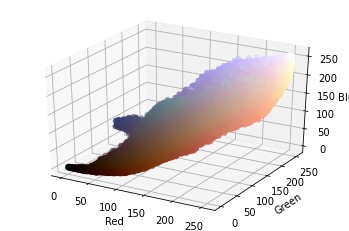

(255, 255, 255)

In [12]:
# if wanting to plot with the above function
# else just delete the commented out lines
fig = pyplot.figure()
plot_colors('../data/example_image/ISIC_0015243.jpg', '../data/example_segmentation/ISIC_0015243_segmentation.png')
#pyplot.show()

In [13]:
df = pd.read_csv('../data/example_ground_truth.csv')
df = pd.DataFrame(df)
df = df[df.seborrheic_keratosis != 1.0] # removing rows with seborrheic 1.0 values
df.drop(['seborrheic_keratosis'], axis='columns', inplace=True) # dropping the keratosis column
df["melanoma"].value_counts

df['diagnosis'] = df["melanoma"].map({0.0: 'not cancerous', 1.0: 'cancerous'})

print("example files:", df.shape[0])
df

example files: 108


,image_id,melanoma,diagnosis
0,ISIC_0001769,0.0,not cancerous
1,ISIC_0001852,0.0,not cancerous
2,ISIC_0001871,0.0,not cancerous
3,ISIC_0003462,0.0,not cancerous
4,ISIC_0003539,0.0,not cancerous
...,...,...,...
145,ISIC_0015443,0.0,not cancerous
146,ISIC_0015445,0.0,not cancerous
147,ISIC_0015483,0.0,not cancerous
148,ISIC_0015496,0.0,not cancerous


### Just R, G and B

In [25]:
#measure_color()[1]

### Average color

In [14]:
average_rgb = []

for i in df['image_id']:
    color = measure_color(f'../data/example_image/{i}.jpg', f'../data/example_segmentation/{i}_segmentation.png')
    average_rgb.append(color[4])
    
average_r = [i[0] for i in average_rgb]
average_g = [i[1] for i in average_rgb]
average_b = [i[2] for i in average_rgb]

average_rgb

[[157, 97, 67],
 [123, 62, 39],
 [179, 130, 98],
 [160, 109, 78],
 [147, 78, 45],
 [117, 69, 52],
 [155, 97, 66],
 [151, 85, 55],
 [152, 92, 54],
 [168, 111, 74],
 [171, 129, 113],
 [186, 124, 101],
 [159, 113, 80],
 [162, 118, 94],
 [181, 105, 69],
 [158, 96, 60],
 [150, 106, 74],
 [169, 107, 79],
 [134, 77, 52],
 [175, 113, 79],
 [154, 105, 79],
 [165, 112, 74],
 [185, 127, 82],
 [161, 136, 109],
 [147, 128, 129],
 [139, 78, 65],
 [122, 80, 61],
 [134, 79, 53],
 [118, 56, 45],
 [142, 89, 61],
 [167, 125, 113],
 [168, 127, 101],
 [103, 58, 39],
 [123, 65, 39],
 [135, 85, 54],
 [124, 63, 55],
 [155, 94, 65],
 [187, 123, 110],
 [163, 98, 70],
 [153, 91, 53],
 [146, 82, 57],
 [132, 83, 68],
 [186, 147, 141],
 [148, 101, 88],
 [177, 105, 87],
 [93, 69, 66],
 [134, 89, 88],
 [171, 109, 73],
 [121, 75, 53],
 [127, 77, 50],
 [172, 124, 106],
 [146, 95, 84],
 [155, 99, 75],
 [121, 73, 58],
 [190, 137, 117],
 [158, 86, 61],
 [136, 79, 60],
 [100, 58, 40],
 [106, 61, 53],
 [138, 81, 56],
 [164,

In [15]:
df['average rgb'] = average_rgb # might as well just remove this?
df['average r'] = average_r
df['average g'] = average_g
df['average b'] = average_b
df

,image_id,melanoma,diagnosis,average rgb,average r,average g,average b
0,ISIC_0001769,0.0,not cancerous,"[157, 97, 67]",157,97,67
1,ISIC_0001852,0.0,not cancerous,"[123, 62, 39]",123,62,39
2,ISIC_0001871,0.0,not cancerous,"[179, 130, 98]",179,130,98
3,ISIC_0003462,0.0,not cancerous,"[160, 109, 78]",160,109,78
4,ISIC_0003539,0.0,not cancerous,"[147, 78, 45]",147,78,45
...,...,...,...,...,...,...,...
145,ISIC_0015443,0.0,not cancerous,"[134, 82, 61]",134,82,61
146,ISIC_0015445,0.0,not cancerous,"[149, 89, 83]",149,89,83
147,ISIC_0015483,0.0,not cancerous,"[148, 109, 96]",148,109,96
148,ISIC_0015496,0.0,not cancerous,"[173, 104, 86]",173,104,86


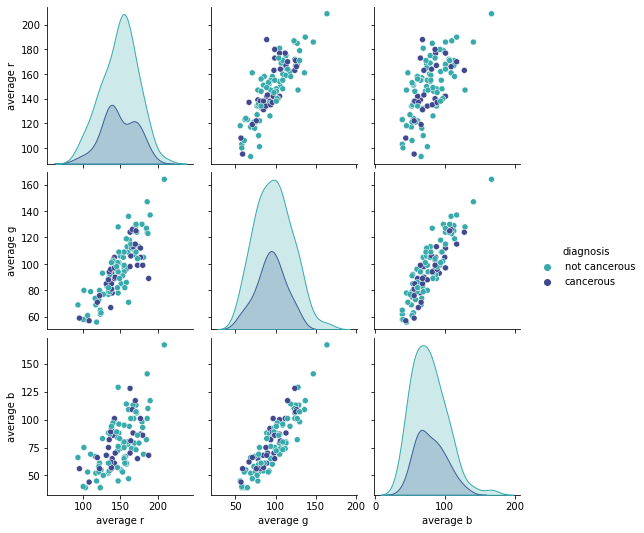

In [16]:
plotting = df.iloc[:,2:7].drop(['average rgb'], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

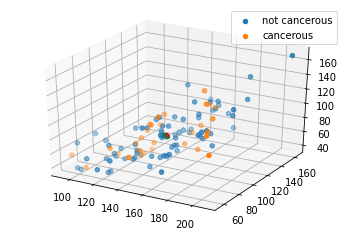

In [17]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in df['diagnosis'].unique():
    ax.scatter(df['average r'][df['diagnosis']==s],df['average g'][df['diagnosis']==s],df['average b'][df['diagnosis']==s],label=s)
    ax.scatter((sum(df['average r'][df['diagnosis']==s])/len(df['average r'][df['diagnosis']==s])), 
               (sum(df['average g'][df['diagnosis']==s])/len(df['average g'][df['diagnosis']==s])), 
               (sum(df['average b'][df['diagnosis']==s])/len(df['average b'][df['diagnosis']==s])), c = "green") # mean for each diagnosis

ax.scatter((sum(df['average r'])/len(df['average r'])), (sum(df['average g'])/len(df['average g'])), (sum(df['average b'])/len(df['average b'])), c = "red") # total mean

ax.legend()

In [18]:
### normalizing the above

In [19]:
norm_average_r = [(i[0]-min(average_r))/(max(average_r)-min(average_r)) for i in average_rgb]
norm_average_g = [(i[1]-min(average_g))/(max(average_g)-min(average_g)) for i in average_rgb]
norm_average_b = [(i[2]-min(average_b))/(max(average_b)-min(average_b)) for i in average_rgb]

df['norm. average r'] = norm_average_r
df['norm. average g'] = norm_average_g
df['norm. average b'] = norm_average_b
df

,image_id,melanoma,diagnosis,average rgb,average r,average g,average b,norm. average r,norm. average g,norm. average b
0,ISIC_0001769,0.0,not cancerous,"[157, 97, 67]",157,97,67,0.551724,0.379630,0.218750
1,ISIC_0001852,0.0,not cancerous,"[123, 62, 39]",123,62,39,0.258621,0.055556,0.000000
2,ISIC_0001871,0.0,not cancerous,"[179, 130, 98]",179,130,98,0.741379,0.685185,0.460938
3,ISIC_0003462,0.0,not cancerous,"[160, 109, 78]",160,109,78,0.577586,0.490741,0.304688
4,ISIC_0003539,0.0,not cancerous,"[147, 78, 45]",147,78,45,0.465517,0.203704,0.046875
...,...,...,...,...,...,...,...,...,...,...
145,ISIC_0015443,0.0,not cancerous,"[134, 82, 61]",134,82,61,0.353448,0.240741,0.171875
146,ISIC_0015445,0.0,not cancerous,"[149, 89, 83]",149,89,83,0.482759,0.305556,0.343750
147,ISIC_0015483,0.0,not cancerous,"[148, 109, 96]",148,109,96,0.474138,0.490741,0.445312
148,ISIC_0015496,0.0,not cancerous,"[173, 104, 86]",173,104,86,0.689655,0.444444,0.367188


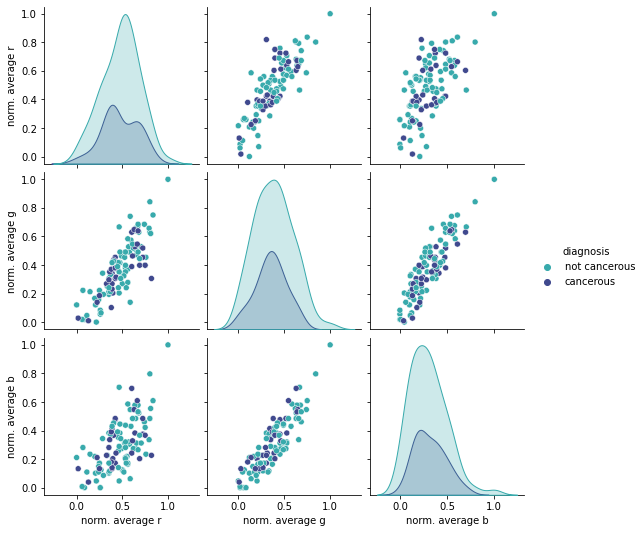

In [20]:
plotting = df.iloc[:,2:].drop(df.columns[[3, 4, 5, 6]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

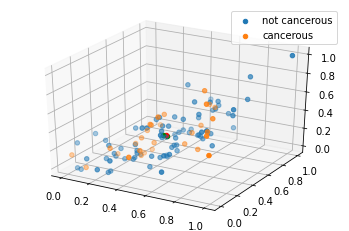

In [21]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in df['diagnosis'].unique():
    ax.scatter(df['norm. average r'][df['diagnosis']==s],df['norm. average g'][df['diagnosis']==s],df['norm. average b'][df['diagnosis']==s],label=s)
    ax.scatter((sum(df['norm. average r'][df['diagnosis']==s])/len(df['norm. average r'][df['diagnosis']==s])), 
               (sum(df['norm. average g'][df['diagnosis']==s])/len(df['norm. average g'][df['diagnosis']==s])), 
               (sum(df['norm. average b'][df['diagnosis']==s])/len(df['norm. average b'][df['diagnosis']==s])), c = "green") # mean for each diagnosis

ax.scatter((sum(df['norm. average r'])/len(df['norm. average r'])), (sum(df['norm. average g'])/len(df['norm. average g'])), (sum(df['norm. average b'])/len(df['norm. average b'])), c = "red") # total mean

ax.legend()

### Width of R, G and B

In [22]:
r_range = []
g_range = []
b_range = []

for i in df['image_id']:
    r_diff, g_diff, b_diff = plot_colors(f'../data/example_image/{i}.jpg', f'../data/example_segmentation/{i}_segmentation.png')
    r_range.append(r_diff)
    g_range.append(g_diff)
    b_range.append(b_diff)

In [23]:
df['r range'] = r_range
df['g range'] = g_range
df['b range'] = b_range
df

,image_id,melanoma,diagnosis,average rgb,average r,average g,average b,norm. average r,norm. average g,norm. average b,r range,g range,b range
0,ISIC_0001769,0.0,not cancerous,"[157, 97, 67]",157,97,67,0.551724,0.379630,0.218750,128,149,145
1,ISIC_0001852,0.0,not cancerous,"[123, 62, 39]",123,62,39,0.258621,0.055556,0.000000,207,246,246
2,ISIC_0001871,0.0,not cancerous,"[179, 130, 98]",179,130,98,0.741379,0.685185,0.460938,80,93,70
3,ISIC_0003462,0.0,not cancerous,"[160, 109, 78]",160,109,78,0.577586,0.490741,0.304688,90,130,119
4,ISIC_0003539,0.0,not cancerous,"[147, 78, 45]",147,78,45,0.465517,0.203704,0.046875,170,167,139
...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,ISIC_0015443,0.0,not cancerous,"[134, 82, 61]",134,82,61,0.353448,0.240741,0.171875,228,184,177
146,ISIC_0015445,0.0,not cancerous,"[149, 89, 83]",149,89,83,0.482759,0.305556,0.343750,227,232,221
147,ISIC_0015483,0.0,not cancerous,"[148, 109, 96]",148,109,96,0.474138,0.490741,0.445312,255,252,254
148,ISIC_0015496,0.0,not cancerous,"[173, 104, 86]",173,104,86,0.689655,0.444444,0.367188,250,255,255


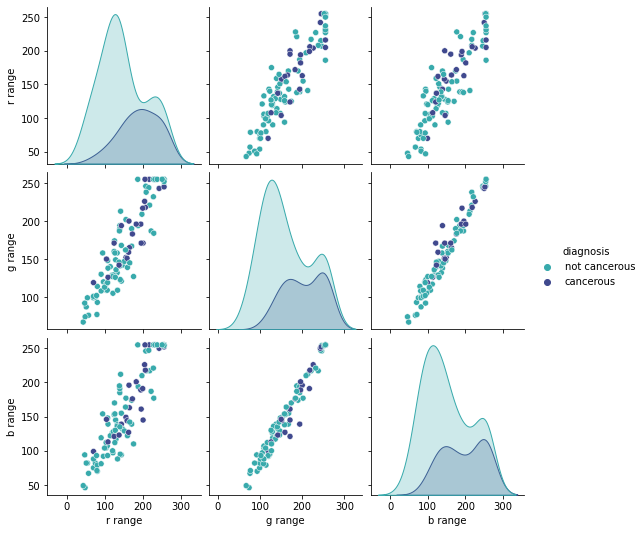

In [24]:
plotting = df.iloc[:,2:13].drop(df.columns[[3, 4, 5, 6, 7, 8, 9]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

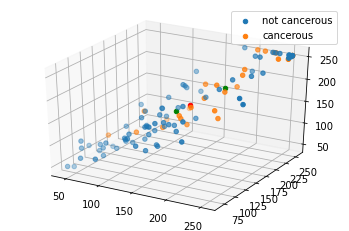

In [25]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in df['diagnosis'].unique():
    ax.scatter(df['r range'][df['diagnosis']==s],df['g range'][df['diagnosis']==s],df['b range'][df['diagnosis']==s],label=s)
    ax.scatter((sum(df['r range'][df['diagnosis']==s])/len(df['r range'][df['diagnosis']==s])), 
               (sum(df['g range'][df['diagnosis']==s])/len(df['g range'][df['diagnosis']==s])), 
               (sum(df['b range'][df['diagnosis']==s])/len(df['b range'][df['diagnosis']==s])), c = "green") # mean for each diagnosis

ax.scatter((sum(df['r range'])/len(df['r range'])), (sum(df['g range'])/len(df['g range'])), (sum(df['b range'])/len(df['b range'])), c = "red") # total mean

ax.legend()

In [26]:
norm_r_range = [(i-min(r_range))/(max(r_range)-min(r_range)) for i in r_range]
norm_g_range = [(i-min(g_range))/(max(g_range)-min(g_range)) for i in g_range]
norm_b_range = [(i-min(b_range))/(max(b_range)-min(b_range)) for i in b_range]

df['norm. r range'] = norm_r_range
df['norm. g range'] = norm_g_range
df['norm. b range'] = norm_b_range
df

,image_id,melanoma,diagnosis,average rgb,average r,average g,average b,norm. average r,norm. average g,norm. average b,r range,g range,b range,norm. r range,norm. g range,norm. b range
0,ISIC_0001769,0.0,not cancerous,"[157, 97, 67]",157,97,67,0.551724,0.379630,0.218750,128,149,145,0.400943,0.436170,0.473684
1,ISIC_0001852,0.0,not cancerous,"[123, 62, 39]",123,62,39,0.258621,0.055556,0.000000,207,246,246,0.773585,0.952128,0.956938
2,ISIC_0001871,0.0,not cancerous,"[179, 130, 98]",179,130,98,0.741379,0.685185,0.460938,80,93,70,0.174528,0.138298,0.114833
3,ISIC_0003462,0.0,not cancerous,"[160, 109, 78]",160,109,78,0.577586,0.490741,0.304688,90,130,119,0.221698,0.335106,0.349282
4,ISIC_0003539,0.0,not cancerous,"[147, 78, 45]",147,78,45,0.465517,0.203704,0.046875,170,167,139,0.599057,0.531915,0.444976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,ISIC_0015443,0.0,not cancerous,"[134, 82, 61]",134,82,61,0.353448,0.240741,0.171875,228,184,177,0.872642,0.622340,0.626794
146,ISIC_0015445,0.0,not cancerous,"[149, 89, 83]",149,89,83,0.482759,0.305556,0.343750,227,232,221,0.867925,0.877660,0.837321
147,ISIC_0015483,0.0,not cancerous,"[148, 109, 96]",148,109,96,0.474138,0.490741,0.445312,255,252,254,1.000000,0.984043,0.995215
148,ISIC_0015496,0.0,not cancerous,"[173, 104, 86]",173,104,86,0.689655,0.444444,0.367188,250,255,255,0.976415,1.000000,1.000000


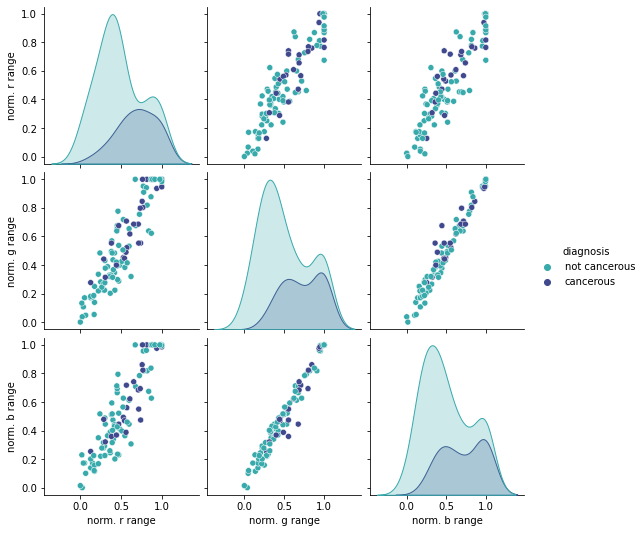

In [27]:
plotting = df.iloc[:,2:16].drop(df.columns[[3, 4, 5, 6, 7, 8, 9, 10, 11, 12]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

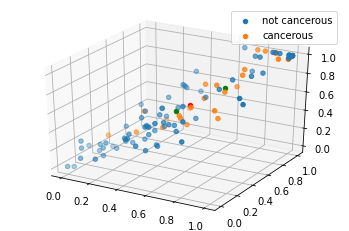

In [28]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in df['diagnosis'].unique():
    ax.scatter(df['norm. r range'][df['diagnosis']==s],df['norm. g range'][df['diagnosis']==s],df['norm. b range'][df['diagnosis']==s],label=s)
    ax.scatter((sum(df['norm. r range'][df['diagnosis']==s])/len(df['norm. r range'][df['diagnosis']==s])), 
               (sum(df['norm. g range'][df['diagnosis']==s])/len(df['norm. g range'][df['diagnosis']==s])), 
               (sum(df['norm. b range'][df['diagnosis']==s])/len(df['norm. b range'][df['diagnosis']==s])), c = "green") # mean for each diagnosis

ax.scatter((sum(df['norm. r range'])/len(df['norm. r range'])), (sum(df['norm. g range'])/len(df['norm. g range'])), (sum(df['norm. b range'])/len(df['b range'])), c = "red") # total mean

ax.legend()

### Number of unique colors in lesion
should probably be relative to how big of a part the lesions takes up of the picture...

In [29]:
total_pixels = []
unique_colors = []
pct_unique_colors = []

for i in df['image_id']:
    t_pixels, u_colors = measure_color(f'../data/example_image/{i}.jpg', f'../data/example_segmentation/{i}_segmentation.png')[1:3]
    total_pixels.append(t_pixels)
    unique_colors.append(u_colors)
    pct_unique_colors.append(u_colors/t_pixels)

In [30]:
df['pct of unique colors'] = pct_unique_colors
df

,image_id,melanoma,diagnosis,average rgb,average r,average g,average b,norm. average r,norm. average g,norm. average b,r range,g range,b range,norm. r range,norm. g range,norm. b range,pct of unique colors
0,ISIC_0001769,0.0,not cancerous,"[157, 97, 67]",157,97,67,0.551724,0.379630,0.218750,128,149,145,0.400943,0.436170,0.473684,0.037102
1,ISIC_0001852,0.0,not cancerous,"[123, 62, 39]",123,62,39,0.258621,0.055556,0.000000,207,246,246,0.773585,0.952128,0.956938,0.063298
2,ISIC_0001871,0.0,not cancerous,"[179, 130, 98]",179,130,98,0.741379,0.685185,0.460938,80,93,70,0.174528,0.138298,0.114833,0.017112
3,ISIC_0003462,0.0,not cancerous,"[160, 109, 78]",160,109,78,0.577586,0.490741,0.304688,90,130,119,0.221698,0.335106,0.349282,0.043004
4,ISIC_0003539,0.0,not cancerous,"[147, 78, 45]",147,78,45,0.465517,0.203704,0.046875,170,167,139,0.599057,0.531915,0.444976,0.048915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,ISIC_0015443,0.0,not cancerous,"[134, 82, 61]",134,82,61,0.353448,0.240741,0.171875,228,184,177,0.872642,0.622340,0.626794,0.003812
146,ISIC_0015445,0.0,not cancerous,"[149, 89, 83]",149,89,83,0.482759,0.305556,0.343750,227,232,221,0.867925,0.877660,0.837321,0.003980
147,ISIC_0015483,0.0,not cancerous,"[148, 109, 96]",148,109,96,0.474138,0.490741,0.445312,255,252,254,1.000000,0.984043,0.995215,0.010672
148,ISIC_0015496,0.0,not cancerous,"[173, 104, 86]",173,104,86,0.689655,0.444444,0.367188,250,255,255,0.976415,1.000000,1.000000,0.006253


In [31]:
df.shape

(108, 17)

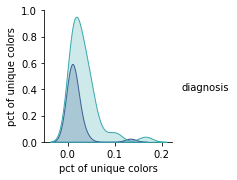

In [32]:
plotting = df.iloc[:,2:19].drop(df.columns[[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

# Getting the big guns

In [33]:
data = pd.read_csv('../../2017/ISIC-2017_Training_Part3_GroundTruth.csv')
data = pd.DataFrame(data)

data = data[data.seborrheic_keratosis != 1.0] # removing rows with seborrheic 1.0 values
data.drop(['seborrheic_keratosis'], axis='columns', inplace=True) # dropping the keratosis column
data["melanoma"].value_counts

data['diagnosis'] = data["melanoma"].map({0.0: 'not cancerous', 1.0: 'cancerous'})

print("example files:", data.shape[0])
data

example files: 1746


,image_id,melanoma,diagnosis
0,ISIC_0000000,0.0,not cancerous
1,ISIC_0000001,0.0,not cancerous
2,ISIC_0000002,1.0,cancerous
3,ISIC_0000003,0.0,not cancerous
4,ISIC_0000004,1.0,cancerous
...,...,...,...
1991,ISIC_0015190,1.0,cancerous
1992,ISIC_0015200,1.0,cancerous
1993,ISIC_0015204,1.0,cancerous
1994,ISIC_0015219,1.0,cancerous


In [34]:
path_img = "../../2017/ISIC-2017_Training_Data/ISIC-2017_Training_Data/"
path_seg = "../../2017/ISIC-2017_Training_Part1_GroundTruth/ISIC-2017_Training_Part1_GroundTruth/"

#### Relative color variance, Average of R, G and B values, Standard deviation for R, G and B values

In [35]:
relative_color_variance = []
average_rgb = []
r_std = []
g_std = []
b_std = []

for i in data['image_id']:
    t_pixels, u_colors, d_colors, avg_rgb, r_sd, g_sd, b_sd = measure_color(f'{path_img}{i}.jpg', f'{path_seg}{i}_segmentation.png')[1:8]
    relative_color_variance.append(u_colors/t_pixels)
    average_rgb.append(avg_rgb)
    r_std.append(r_sd)
    g_std.append(g_sd)
    b_std.append(b_sd)

In [36]:
table = pd.read_csv("../data/melanoma_healthy_sym.csv")
table['relative_color_variance'] = relative_color_variance
#table.to_csv("../data/sym_col.csv")
table

,image_id,melanoma,area,perimeter,diagnosis_sum,compactness,vertical_symmetry,horisontal_symmetry,symmetry,relative_color_variance
0,ISIC_0000000,0.0,364956.0,2258.0,not cancerous,1.111725,0.852509,0.905879,0.879194,0.043466
1,ISIC_0000001,0.0,53432.0,914.0,not cancerous,1.244174,0.864663,0.917303,0.890983,0.146691
2,ISIC_0000002,1.0,237402.0,2071.0,cancerous,1.437692,0.897238,0.932438,0.914838,0.071141
3,ISIC_0000003,0.0,260712.0,1848.0,not cancerous,1.042397,0.828387,0.876698,0.852543,0.085543
4,ISIC_0000004,1.0,269484.0,1746.0,cancerous,0.900214,0.922531,0.861041,0.891786,0.232600
...,...,...,...,...,...,...,...,...,...,...
1741,ISIC_0015190,1.0,12575987.0,18268.0,cancerous,2.111690,0.758524,0.705024,0.731774,0.003178
1742,ISIC_0015200,1.0,20680044.0,21573.0,cancerous,1.790852,0.816416,0.819320,0.817868,0.009077
1743,ISIC_0015204,1.0,13977416.0,17821.0,cancerous,1.808121,0.822694,0.843351,0.833022,0.005556
1744,ISIC_0015219,1.0,8019976.0,13546.0,cancerous,1.820703,0.968623,0.868295,0.918459,0.007423


In [41]:
r_std

[37.49750887028246,
 32.75437995574826,
 23.087982233761327,
 37.63668743291123,
 38.44212687330733,
 14.977937342589742,
 22.305948960377318,
 37.121439045541834,
 22.686538106713407,
 28.445821017592472,
 21.93064918947305,
 23.6056411634568,
 45.099554364850334,
 14.480402652222493,
 23.74658827136971,
 33.01487308648195,
 28.35120669388976,
 19.681887166050952,
 35.43416958189709,
 33.129075308323635,
 16.346329199816726,
 23.211178046814908,
 20.66076140598123,
 12.053772399463647,
 20.545741901251063,
 11.446605499649428,
 24.002898918735028,
 38.09243803213883,
 47.292516602189174,
 42.34518603190751,
 36.44012318466035,
 20.58244914149783,
 23.192939082094238,
 18.25494770331307,
 38.31543541694394,
 34.755435435873636,
 35.765409558499414,
 35.75697162004006,
 11.985796561037585,
 26.763792758537065,
 36.426012513387555,
 45.0204669602894,
 36.99366371791808,
 36.086211959043474,
 12.811790340193387,
 39.38705113003768,
 41.48008128313983,
 42.255453167748975,
 19.806229188263

In [221]:
norm_average_r = [(i[0]-min(average_r))/(max(average_r)-min(average_r)) for i in average_rgb]
norm_average_g = [(i[1]-min(average_g))/(max(average_g)-min(average_g)) for i in average_rgb]
norm_average_b = [(i[2]-min(average_b))/(max(average_b)-min(average_b)) for i in average_rgb]

table['norm_average_r'] = norm_average_r
table['norm_average_g'] = norm_average_g
table['norm_average_b'] = norm_average_b

norm_r_std = [(i-min(r_std))/(max(r_std)-min(r_std)) for i in r_std]
norm_g_std = [(i-min(g_std))/(max(g_std)-min(g_std)) for i in g_std]
norm_b_std = [(i-min(b_std))/(max(b_std)-min(b_std)) for i in b_std]

table['norm_r_std'] = norm_r_std
table['norm_g_std'] = norm_g_std
table['norm_b_std'] = norm_b_std

# mean of norm_rgb_std
table['average_std'] = (table['norm_r_std'] + table['norm_g_std'] + table['norm_b_std'])/3

table

,image_id,melanoma,area,perimeter,diagnosis_sum,compactness,vertical_symmetry,horisontal_symmetry,symmetry,relative_color_variance,norm_average_r,norm_average_g,norm_average_b,norm_r_std,norm_g_std,norm_b_std,average_std
0,ISIC_0000000,0.0,364956.0,2258.0,not cancerous,1.111725,0.852509,0.905879,0.879194,0.043466,0.247368,0.391026,0.500000,0.548790,0.635656,0.620079,0.601509
1,ISIC_0000001,0.0,53432.0,914.0,not cancerous,1.244174,0.864663,0.917303,0.890983,0.146691,0.194737,0.185897,0.170886,0.469040,0.358286,0.230568,0.352631
2,ISIC_0000002,1.0,237402.0,2071.0,cancerous,1.437692,0.897238,0.932438,0.914838,0.071141,0.373684,0.448718,0.544304,0.306510,0.470411,0.564853,0.447258
3,ISIC_0000003,0.0,260712.0,1848.0,not cancerous,1.042397,0.828387,0.876698,0.852543,0.085543,0.431579,0.429487,0.348101,0.551130,0.550863,0.427640,0.509878
4,ISIC_0000004,1.0,269484.0,1746.0,cancerous,0.900214,0.922531,0.861041,0.891786,0.232600,0.663158,0.538462,0.759494,0.564673,0.540691,0.523281,0.542882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1741,ISIC_0015190,1.0,12575987.0,18268.0,cancerous,2.111690,0.758524,0.705024,0.731774,0.003178,0.563158,0.339744,0.259494,0.726689,0.579115,0.436332,0.580712
1742,ISIC_0015200,1.0,20680044.0,21573.0,cancerous,1.790852,0.816416,0.819320,0.817868,0.009077,0.589474,0.673077,0.645570,0.874735,0.920416,0.844189,0.879780
1743,ISIC_0015204,1.0,13977416.0,17821.0,cancerous,1.808121,0.822694,0.843351,0.833022,0.005556,0.563158,0.602564,0.639241,0.824186,0.937002,0.912955,0.891381
1744,ISIC_0015219,1.0,8019976.0,13546.0,cancerous,1.820703,0.968623,0.868295,0.918459,0.007423,0.489474,0.237179,0.322785,0.739300,0.516884,0.484206,0.580130


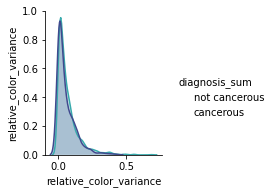

In [162]:
# plotting relative color variance
plotting = table.iloc[:,4:10].drop(table.columns[[5, 6, 7, 8]], axis=1)
sns.pairplot(plotting, hue='diagnosis_sum', palette="mako_r")

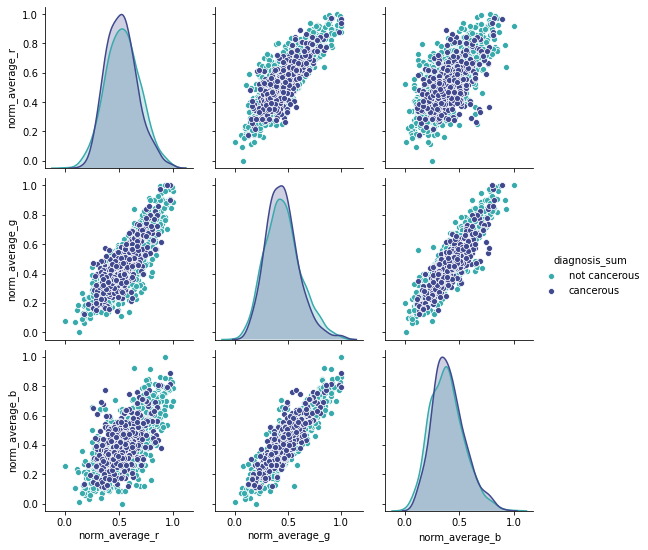

In [163]:
# plotting average for r, g and b
plotting = table.iloc[:,4:13].drop(table.columns[[5, 6, 7, 8, 9]], axis=1)
sns.pairplot(plotting, hue='diagnosis_sum', palette="mako_r")

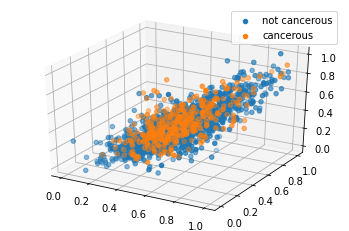

In [164]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in table['diagnosis_sum'].unique():
    ax.scatter(table['norm_average_r'][table['diagnosis_sum']==s],table['norm_average_g'][table['diagnosis_sum']==s],table['norm_average_b'][table['diagnosis_sum']==s],label=s)
    ax.scatter((sum(table['norm_average_r'][table['diagnosis_sum']==s])/len(table['norm_average_r'][table['diagnosis_sum']==s])), 
               (sum(table['norm_average_g'][table['diagnosis_sum']==s])/len(table['norm_average_g'][table['diagnosis_sum']==s])), 
               (sum(table['norm_average_b'][table['diagnosis_sum']==s])/len(table['norm_average_b'][table['diagnosis_sum']==s])), c = "green") # mean for each diagnosis

ax.scatter((sum(table['norm_average_r'])/len(table['norm_average_r'])), (sum(table['norm_average_g'])/len(table['norm_average_g'])), (sum(table['norm_average_b'])/len(table['norm_average_b'])), c = "red") # total mean

ax.legend()

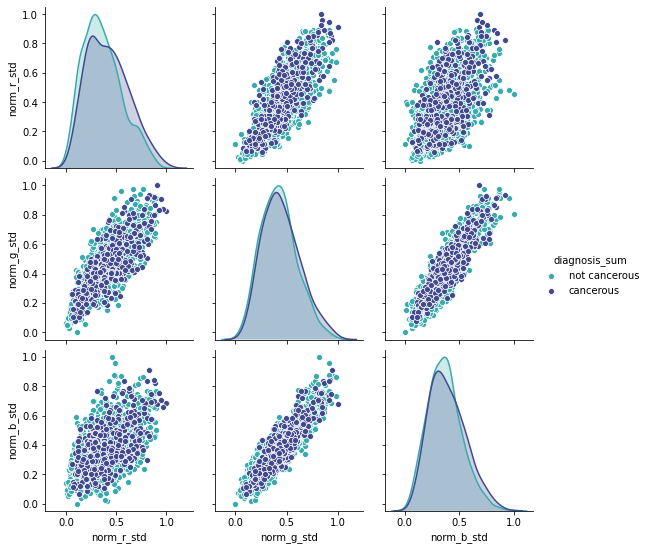

In [216]:
# plotting standard deviation for r, g and b
plotting = table.iloc[:,4:16].drop(table.columns[[5, 6, 7, 8, 9, 10, 11, 12]], axis=1)
sns.pairplot(plotting, hue='diagnosis_sum', palette="mako_r")

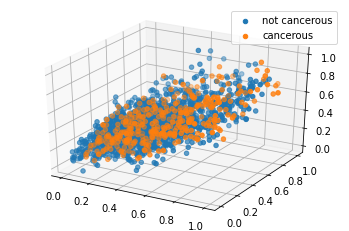

In [217]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in table['diagnosis_sum'].unique():
    ax.scatter(table['norm_r_std'][table['diagnosis_sum']==s],table['norm_g_std'][table['diagnosis_sum']==s],table['norm_b_std'][table['diagnosis_sum']==s],label=s)
    ax.scatter((sum(table['norm_r_std'][table['diagnosis_sum']==s])/len(table['norm_r_std'][table['diagnosis_sum']==s])), 
               (sum(table['norm_g_std'][table['diagnosis_sum']==s])/len(table['norm_g_std'][table['diagnosis_sum']==s])), 
               (sum(table['norm_b_std'][table['diagnosis_sum']==s])/len(table['norm_b_std'][table['diagnosis_sum']==s])), c = "green") # mean for each diagnosis

ax.scatter((sum(table['norm_average_r'])/len(table['norm_average_r'])), (sum(table['norm_average_g'])/len(table['norm_average_g'])), (sum(table['norm_average_b'])/len(table['norm_average_b'])), c = "red") # total mean

ax.legend()

In [6]:
table = pd.read_csv("../data/sym_col.csv")

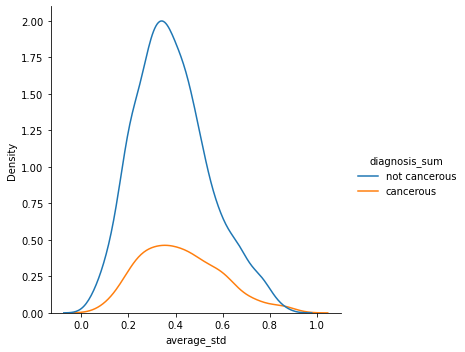

In [4]:
# plotting average std
sns.displot(table, x='average_std', hue='diagnosis_sum', kind = "kde")

#### Range of RGB

In [42]:
r_range = []
g_range = []
b_range = []

for i in table['image_id']:
    r_diff, g_diff, b_diff = plot_colors(f'{path_img}{i}.jpg', f'{path_seg}{i}_segmentation.png')
    r_range.append(r_diff)
    g_range.append(g_diff)
    b_range.append(b_diff)

In [45]:
r_range

[159,
 149,
 120,
 177,
 234,
 77,
 115,
 168,
 114,
 129,
 111,
 106,
 189,
 84,
 109,
 144,
 130,
 92,
 156,
 167,
 97,
 115,
 111,
 95,
 105,
 86,
 106,
 170,
 205,
 213,
 217,
 126,
 117,
 94,
 184,
 155,
 177,
 167,
 102,
 120,
 179,
 240,
 173,
 185,
 104,
 175,
 169,
 184,
 116,
 136,
 136,
 173,
 122,
 104,
 88,
 102,
 138,
 158,
 143,
 191,
 141,
 137,
 204,
 167,
 185,
 98,
 70,
 161,
 160,
 162,
 162,
 113,
 99,
 100,
 205,
 130,
 176,
 180,
 126,
 190,
 232,
 222,
 107,
 60,
 108,
 99,
 183,
 140,
 225,
 154,
 177,
 233,
 191,
 206,
 238,
 243,
 183,
 187,
 228,
 138,
 102,
 231,
 119,
 155,
 138,
 167,
 176,
 174,
 88,
 160,
 222,
 183,
 140,
 232,
 211,
 153,
 169,
 198,
 213,
 109,
 120,
 156,
 220,
 234,
 124,
 203,
 219,
 255,
 200,
 243,
 192,
 176,
 236,
 233,
 221,
 160,
 192,
 171,
 215,
 104,
 148,
 255,
 232,
 193,
 213,
 165,
 240,
 194,
 226,
 204,
 235,
 211,
 174,
 160,
 182,
 222,
 183,
 141,
 201,
 211,
 192,
 138,
 180,
 162,
 136,
 176,
 173,
 208,
 213,


In [44]:
norm_r_range = [(i-min(r_range))/(max(r_range)-min(r_range)) for i in r_range]
norm_g_range = [(i-min(g_range))/(max(g_range)-min(g_range)) for i in g_range]
norm_b_range = [(i-min(b_range))/(max(b_range)-min(b_range)) for i in b_range]

table['norm_r_range'] = norm_r_range
table['norm_g_range'] = norm_g_range
table['norm_b_range'] = norm_b_range
#table.to_csv("../data/sym_col.csv")
table

,image_id,melanoma,area,perimeter,diagnosis_sum,compactness,vertical_symmetry,horisontal_symmetry,symmetry,relative_color_variance,norm_r_range,norm_g_range,norm_b_range
0,ISIC_0000000,0.0,364956.0,2258.0,not cancerous,1.111725,0.852509,0.905879,0.879194,0.043466,0.567568,0.592233,0.740741
1,ISIC_0000001,0.0,53432.0,914.0,not cancerous,1.244174,0.864663,0.917303,0.890983,0.146691,0.522523,0.378641,0.398148
2,ISIC_0000002,1.0,237402.0,2071.0,cancerous,1.437692,0.897238,0.932438,0.914838,0.071141,0.391892,0.470874,0.657407
3,ISIC_0000003,0.0,260712.0,1848.0,not cancerous,1.042397,0.828387,0.876698,0.852543,0.085543,0.648649,0.606796,0.537037
4,ISIC_0000004,1.0,269484.0,1746.0,cancerous,0.900214,0.922531,0.861041,0.891786,0.232600,0.905405,0.893204,0.907407
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1741,ISIC_0015190,1.0,12575987.0,18268.0,cancerous,2.111690,0.758524,0.705024,0.731774,0.003178,0.815315,0.728155,0.685185
1742,ISIC_0015200,1.0,20680044.0,21573.0,cancerous,1.790852,0.816416,0.819320,0.817868,0.009077,0.990991,1.000000,1.000000
1743,ISIC_0015204,1.0,13977416.0,17821.0,cancerous,1.808121,0.822694,0.843351,0.833022,0.005556,0.981982,1.000000,1.000000
1744,ISIC_0015219,1.0,8019976.0,13546.0,cancerous,1.820703,0.968623,0.868295,0.918459,0.007423,0.900901,0.995146,1.000000


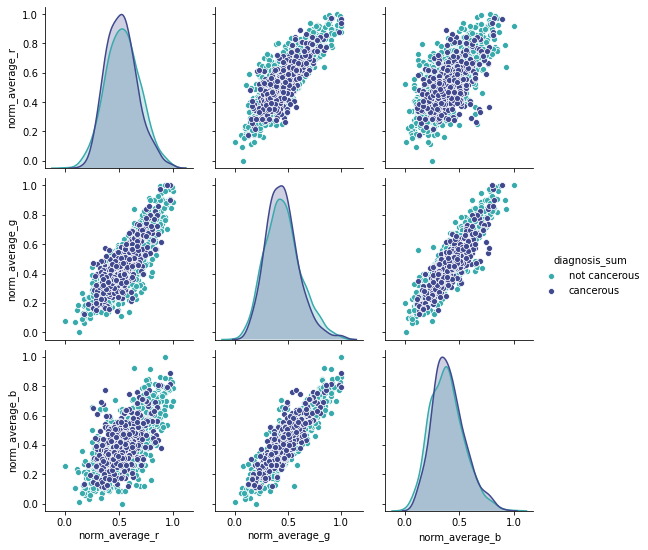

In [224]:
plotting = table.iloc[:,4:13].drop(table.columns[[5, 6, 7, 8, 9]], axis=1)
sns.pairplot(plotting, hue='diagnosis_sum', palette="mako_r")

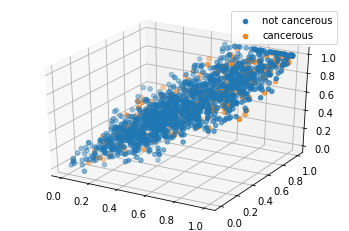

In [156]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in table['diagnosis_sum'].unique():
    ax.scatter(table['norm_r_range'][table['diagnosis_sum']==s],table['norm_g_range'][table['diagnosis_sum']==s],table['norm_b_range'][table['diagnosis_sum']==s],label=s)
    ax.scatter((sum(table['norm_r_range'][table['diagnosis_sum']==s])/len(table['norm_r_range'][table['diagnosis_sum']==s])), 
               (sum(table['norm_g_range'][table['diagnosis_sum']==s])/len(table['norm_g_range'][table['diagnosis_sum']==s])), 
               (sum(table['norm_b_range'][table['diagnosis_sum']==s])/len(table['norm_b_range'][table['diagnosis_sum']==s])), c = "green") # mean for each diagnosis

ax.scatter((sum(table['norm_r_range'])/len(table['norm_r_range'])), (sum(table['norm_g_range'])/len(table['norm_g_range'])), (sum(table['norm_b_range'])/len(table['norm_b_range'])), c = "red") # total mean

ax.legend()

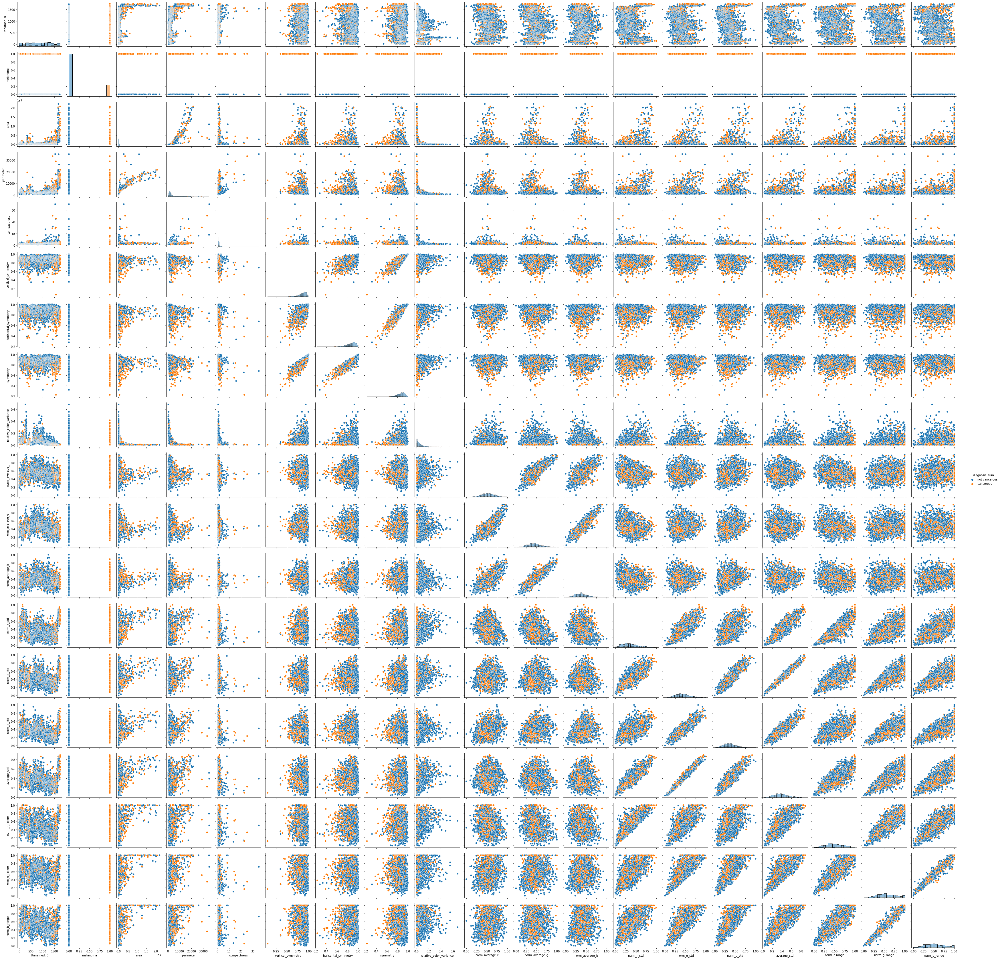

In [7]:
# all of the seaborn plots
sns.pairplot(table, hue="diagnosis_sum", diag_kind="hist")

In [12]:
healthy = image_segmentation('../data/example_image/ISIC_0001769.jpg', '../data/example_segmentation/ISIC_0001769_segmentation.png')
color_of_image(healthy) # !!! np.array, using mask made
dom_healthy = dominant_colors(healthy)
dom_healthy

[(456, (177, 122, 91)),
 (419, (168, 105, 72)),
 (383, (179, 124, 93)),
 (380, (178, 123, 92)),
 (379, (169, 107, 70))]

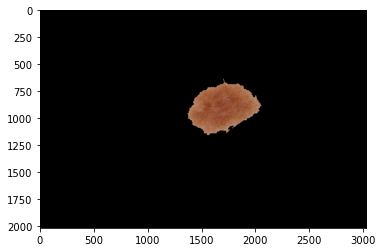

In [32]:
plt.imshow(healthy)

In [17]:
for i in dom_healthy:
    dominant_r = [i[1][0] for i in dom_healthy]
    dominant_g = [i[1][1] for i in dom_healthy]
    dominant_b = [i[1][2] for i in dom_healthy]

print(dominant_r)
print(dominant_g)
print(dominant_b)

range_dominant_r = max(dominant_r)-min(dominant_r)
range_dominant_g = max(dominant_g)-min(dominant_g)
range_dominant_b = max(dominant_b)-min(dominant_b)
print(range_dominant_r)

[177, 168, 179, 178, 169]
[122, 105, 124, 123, 107]
[91, 72, 93, 92, 70]
11


In [18]:
mel = image_segmentation('../data/example_image/ISIC_0014931.jpg', '../data/example_segmentation/ISIC_0014931_segmentation.png')
color_of_image(mel) # !!! np.array, using mask made
dom_mel = dominant_colors(mel)
dom_mel
# problem: the lesion takes up way more space of the image compared to others...

[(18277, (69, 12, 5)),
 (17647, (68, 11, 4)),
 (17105, (63, 10, 4)),
 (16597, (70, 13, 6)),
 (16168, (62, 9, 3))]

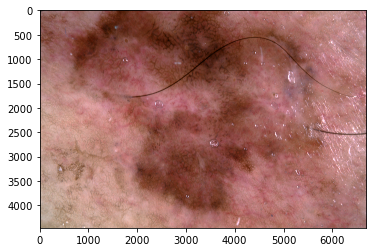

In [19]:
look1 = plt.imread('../data/example_image/ISIC_0015243.jpg')
plt.imshow(look1)

In [47]:
from skimage import data
import numpy as np
import matplotlib.pyplot as plt

import skimage.data as data
import skimage.segmentation as seg
import skimage.filters as filters
import skimage.draw as draw
import skimage.color as color

In [49]:
image_slic1 = seg.slic(healthy, n_segments=155, start_label = 1)

In [51]:
image_slic1

array([[  1,   1,   1, ...,  15,  15,  15],
       [  1,   1,   1, ...,  15,  15,  15],
       [  1,   1,   1, ...,  15,  15,  15],
       ...,
       [136, 136, 136, ..., 143, 143, 143],
       [136, 136, 136, ..., 143, 143, 143],
       [136, 136, 136, ..., 143, 143, 143]])

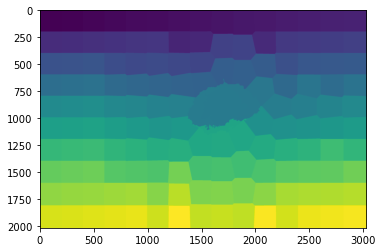

In [52]:
plt.imshow(image_slic1)

In [53]:
lala = color.label2rgb(image_slic1, healthy, kind='avg', bg_label = 0)

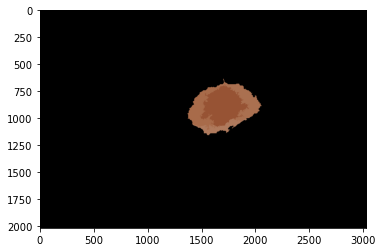

In [54]:
plt.imshow(lala.astype('uint8'))

In [55]:
# RAsmus' crop-function

def crop_to_lesion(picture, segment):
    height = segment.shape[0]
    width = segment.shape[1]
       
    img_df = pd.DataFrame(segment)    
    
    x_1 = x_2 = 0
    y_1 = y_ = 0
    
    for i in range(width):
        if list(img_df[i]).count(1.0) > 0:
            x_1 = i
            break
        else:
            continue
            
    for i in range(width):
        if list(img_df[(width-1) - i]).count(1.0) > 0:
            x_2 = ((width-1) - i)
            break
        else:
            continue   
    
    for i in range(height):
        if list(img_df.loc[i]).count(1.0) > 0:
            y_1 = i
            break
        else:
            continue   

    for i in range(height):
        if list(img_df.loc[(height-1) - i]).count(1.0) > 0:
            y_2 = ((height-1) - i)
            break
        else:
            continue
    
    img_part = picture[y_1:y_2,x_1:x_2]
    segment_part = segment[y_1:y_2,x_1:x_2]
    
    return (img_part, segment_part)

In [61]:
# adjusted to go along with the crop_to_lesion function
def image_segmentation1(original, segmentation):

    segmented_image = original.copy()
    segmented_image[segmentation==0] = 0

    return segmented_image

In [65]:
in1 = plt.imread('../data/example_image/ISIC_0001769.jpg')
in2 = plt.imread('../data/example_segmentation/ISIC_0001769_segmentation.png')
img_part, segment_part = crop_to_lesion(in1, in2)

yes = image_segmentation1(img_part, segment_part)

In [66]:
image_slic = seg.slic(yes, n_segments=155, start_label = 1)
image_slic

array([[  1,   1,   1, ...,  14,  14,  14],
       [  1,   1,   1, ...,  14,  14,  14],
       [  1,   1,   1, ...,  14,  14,  14],
       ...,
       [132, 132, 132, ..., 135, 135, 135],
       [132, 132, 132, ..., 135, 135, 135],
       [132, 132, 132, ..., 135, 135, 135]])

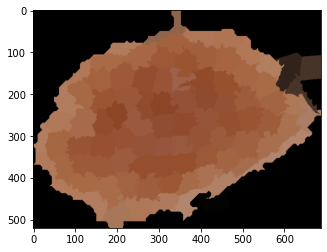

In [71]:
hope = color.label2rgb(image_slic, yes, kind='avg', bg_label = 0)
doesthiswork = hope.astype('uint8')
plt.imshow(doesthiswork) # yes

In [70]:
dominant_colors(hope)

[(5290, (169, 106, 70)),
 (5244, (158, 90, 56)),
 (5213, (178, 125, 95)),
 (4618, (71, 52, 41)),
 (3547, (49, 35, 27))]

In [77]:
def image_slicing(picture, segment):
    img_crop, seg_crop = crop_to_lesion(picture, segment)
    img_segm = image_segmentation1(img_crop, seg_crop)
    
    image_slic = seg.slic(yes, n_segments=155, start_label = 1)
    som = color.label2rgb(image_slic, yes, kind='avg', bg_label = 0)
    image_sliced = hope.astype('uint8')
    
    return image_sliced

(520, 687, 3)

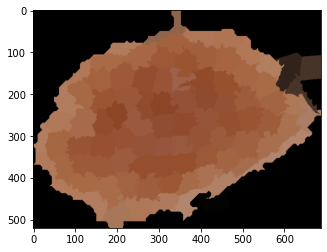

In [85]:
in1 = plt.imread('../data/example_image/ISIC_0001769.jpg')
in2 = plt.imread('../data/example_segmentation/ISIC_0001769_segmentation.png')
here = image_slicing(in1, in2)
plt.imshow(here)
here.shape

In [89]:
tester = pd.read_csv("../data/example_ground_truth.csv")
tester = tester[tester.seborrheic_keratosis != 1.0]
tester.drop(['seborrheic_keratosis'], axis='columns', inplace=True)
tester

,image_id,melanoma
0,ISIC_0001769,0.0
1,ISIC_0001852,0.0
2,ISIC_0001871,0.0
3,ISIC_0003462,0.0
4,ISIC_0003539,0.0
...,...,...
145,ISIC_0015443,0.0
146,ISIC_0015445,0.0
147,ISIC_0015483,0.0
148,ISIC_0015496,0.0


In [86]:
shapes = []

for i in tester['image_id']:
    read1, read2 = plt.imread(f'../data/example_image/{i}.jpg'), plt.imread(f'../data/example_segmentation/{i}_segmentation.png')
    slicing = image_slicing(read1, read2)
    shape = slicing.shape
    shapes.append(shape)
    #shapes.shape()
    #plt.imshow(slicing)

In [87]:
shapes

[(520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 687, 3),
 (520, 6

# Balanced data plotting

In [3]:
all_data = pd.read_csv('../data/processed/final_balanced.csv')
all_data.columns

Index(['image_id', 'melanoma', 'seborrheic_keratosis', 'radius_sd',
       'radius_mean', 'area', 'perimeter', 'compactness', 'diagnosis_sum',
       'diagnosis', 'vertical_symmetry', 'horisontal_symmetry', 'symmetry',
       'relative_color_variance', 'r_average', 'g_average', 'b_average',
       'r_std', 'g_std', 'b_std', 'average_std', 'r_range', 'g_range',
       'b_range', 'r_pct', 'g_pct', 'b_pct', 'r_low', 'b_high',
       'radius_sd_norm', 'radius_mean_norm', 'area_norm', 'perimeter_norm',
       'compactness_norm'],
      dtype='object')

In [6]:
color_plotting = all_data.drop(["image_id", "melanoma", "seborrheic_keratosis", "radius_sd", "radius_mean", "area", "perimeter", "compactness", "diagnosis_sum", "vertical_symmetry", "horisontal_symmetry", "symmetry", "radius_sd_norm", "radius_mean_norm", "area_norm", "perimeter_norm", "compactness_norm"], axis = 1)
color_plotting

,diagnosis,relative_color_variance,r_average,g_average,b_average,r_std,g_std,b_std,average_std,r_range,g_range,b_range,r_pct,g_pct,b_pct,r_low,b_high
0,cancerous,0.071141,0.373684,0.448718,0.544304,0.306510,0.470412,0.564853,0.480467,0.391892,0.470874,0.666667,0.3697,0.3071,0.3233,0.0005,0.2243
1,cancerous,0.232600,0.663158,0.538462,0.759494,0.564672,0.540692,0.523281,0.592497,0.905405,0.893204,0.859903,0.4066,0.2685,0.3249,0.0081,0.4463
2,cancerous,0.101722,0.357895,0.326923,0.284810,0.676611,0.578115,0.432298,0.613275,0.702703,0.543689,0.550725,0.4424,0.3084,0.2493,0.0649,0.0306
3,cancerous,0.020968,0.463158,0.455128,0.417722,0.308581,0.512897,0.566411,0.497068,0.369369,0.548544,0.671498,0.4226,0.3126,0.2648,0.0000,0.1009
4,cancerous,0.007802,0.542105,0.551282,0.613924,0.110772,0.239382,0.293557,0.206646,0.238739,0.296117,0.391304,0.3962,0.3013,0.3025,0.0000,0.1705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743,not cancerous,0.045417,0.568421,0.506410,0.430380,0.432913,0.539051,0.517400,0.536255,0.675676,0.708738,0.797101,0.4426,0.3091,0.2484,0.0000,0.1051
744,not cancerous,0.028806,0.757895,0.583333,0.417722,0.537049,0.743669,0.660904,0.710663,0.585586,0.898058,1.000000,0.4797,0.3032,0.2172,0.0000,0.1547
745,not cancerous,0.018383,0.600000,0.493590,0.398734,0.397017,0.529479,0.472606,0.499768,0.603604,0.718447,0.724638,0.4601,0.3048,0.2351,0.0000,0.0812
746,not cancerous,0.020570,0.921053,0.897436,0.753165,0.105410,0.253031,0.336312,0.227075,0.144144,0.359223,0.497585,0.4203,0.3198,0.2599,0.0000,0.4178


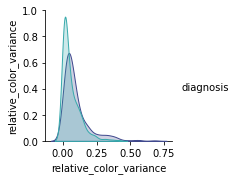

In [7]:
plotting = color_plotting.iloc[:,0:2]
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

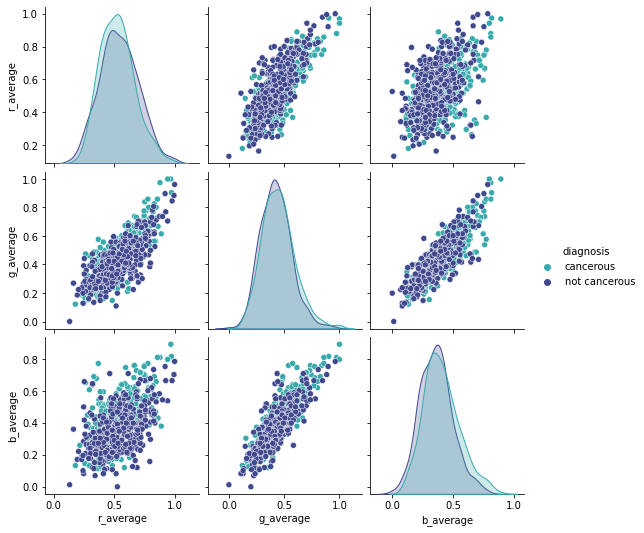

In [8]:
# average plots
plotting = color_plotting.iloc[:,0:5].drop(color_plotting.columns[[1]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

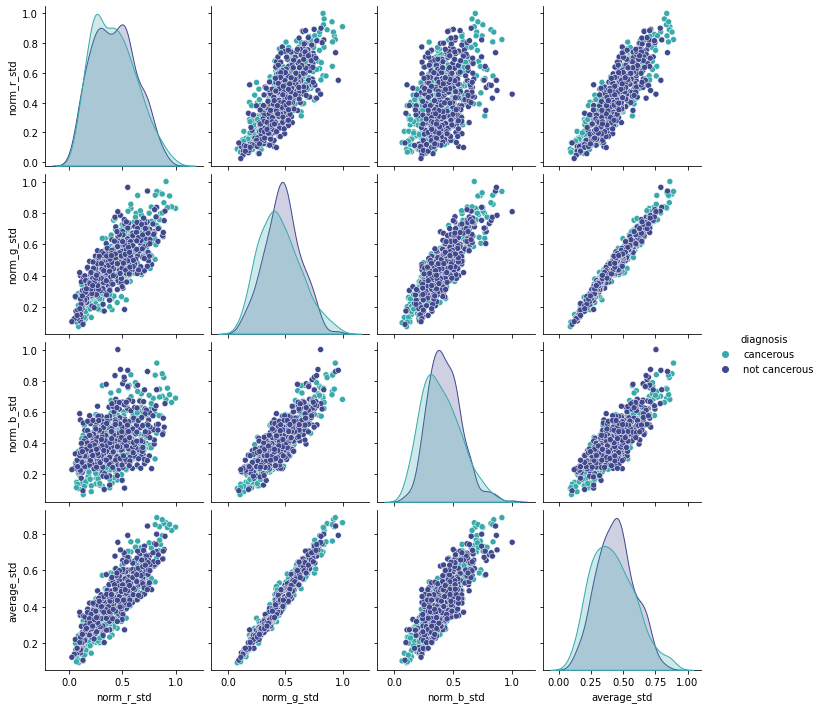

In [119]:
# standard deviation (also average)
plotting = color_plotting.iloc[:,0:9].drop(color_plotting.columns[[1, 2, 3, 4]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

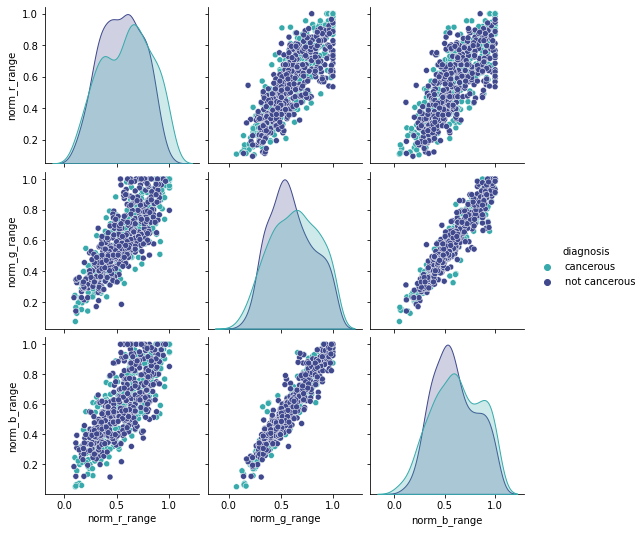

In [120]:
# range
plotting = color_plotting.iloc[:,0:12].drop(color_plotting.columns[[1, 2, 3, 4, 5, 6, 7, 8]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

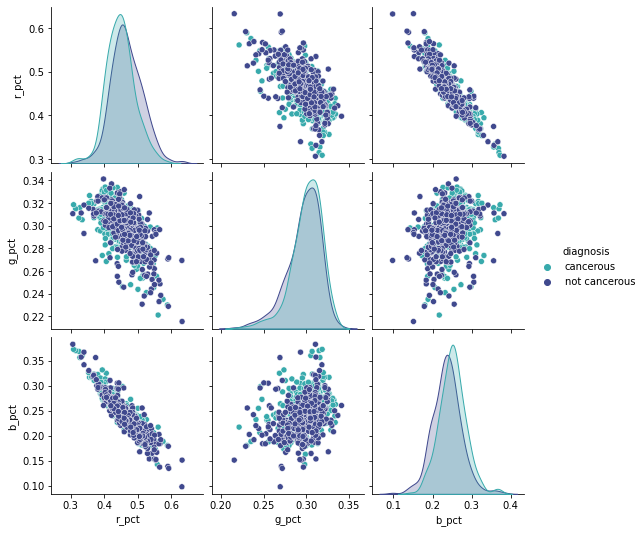

In [12]:
# Percentage
plotting = color_plotting.iloc[:,0:15].drop(color_plotting.columns[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

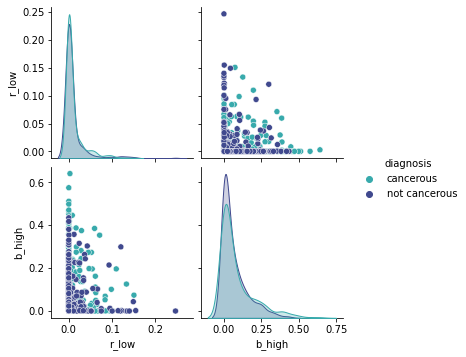

In [13]:
# High and lows
plotting = color_plotting.iloc[:,0:19].drop(color_plotting.columns[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

# All data plotting

In [24]:
c_mes = pd.read_csv('../data/all_color_measurements.csv')
c_mes = c_mes.drop(c_mes.columns[[0, 1, 2]], axis = 1)
c_mes

,diagnosis,relative_color_variance,r_average,g_average,b_average,r_std,g_std,b_std,average_std,r_range,g_range,b_range,r_pct,g_pct,b_pct,r_low,b_high
0,not cancerous,0.043466,0.247368,0.391026,0.500000,0.548790,0.635656,0.620079,0.660033,0.567568,0.592233,0.710145,0.3399,0.3183,0.3418,0.0932,0.2144
1,not cancerous,0.146691,0.194737,0.185897,0.170886,0.469040,0.358286,0.230567,0.367522,0.522523,0.378641,0.396135,0.4428,0.3104,0.2469,0.1328,0.0000
2,cancerous,0.071141,0.373684,0.448718,0.544304,0.306510,0.470412,0.564853,0.480467,0.391892,0.470874,0.666667,0.3697,0.3071,0.3233,0.0005,0.2243
3,not cancerous,0.085543,0.431579,0.429487,0.348101,0.551130,0.550864,0.427639,0.550965,0.648649,0.606796,0.545894,0.4319,0.3204,0.2477,0.0024,0.0393
4,cancerous,0.232600,0.663158,0.538462,0.759494,0.564672,0.540692,0.523281,0.592497,0.905405,0.893204,0.859903,0.4066,0.2685,0.3249,0.0081,0.4463
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1741,cancerous,0.003178,0.563158,0.339744,0.259494,0.726688,0.579115,0.436331,0.635530,0.815315,0.728155,0.671498,0.5159,0.2778,0.2063,0.0013,0.0075
1742,cancerous,0.009077,0.589474,0.673077,0.645570,0.874735,0.920418,0.844189,0.985986,0.990991,1.000000,1.000000,0.3863,0.3225,0.2911,0.0294,0.3748
1743,cancerous,0.005556,0.563158,0.602564,0.639241,0.824185,0.937003,0.912955,1.000000,0.981982,1.000000,1.000000,0.3905,0.3102,0.2994,0.0168,0.3873
1744,cancerous,0.007423,0.489474,0.237179,0.322785,0.739300,0.516885,0.484206,0.638342,0.900901,0.995146,1.000000,0.5013,0.2439,0.2548,0.0132,0.0368


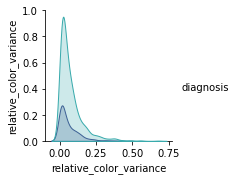

In [35]:
# Relative color variance
plotting = c_mes.iloc[:,0:2]
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

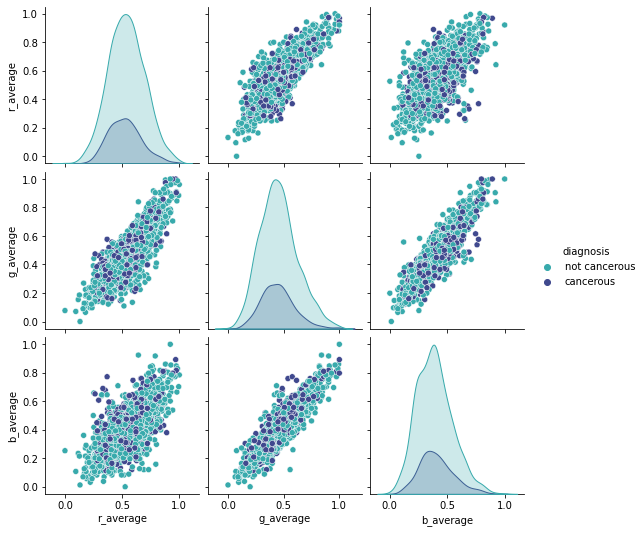

In [36]:
# Average
plotting = c_mes.iloc[:,0:5].drop(color_plotting.columns[[1]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

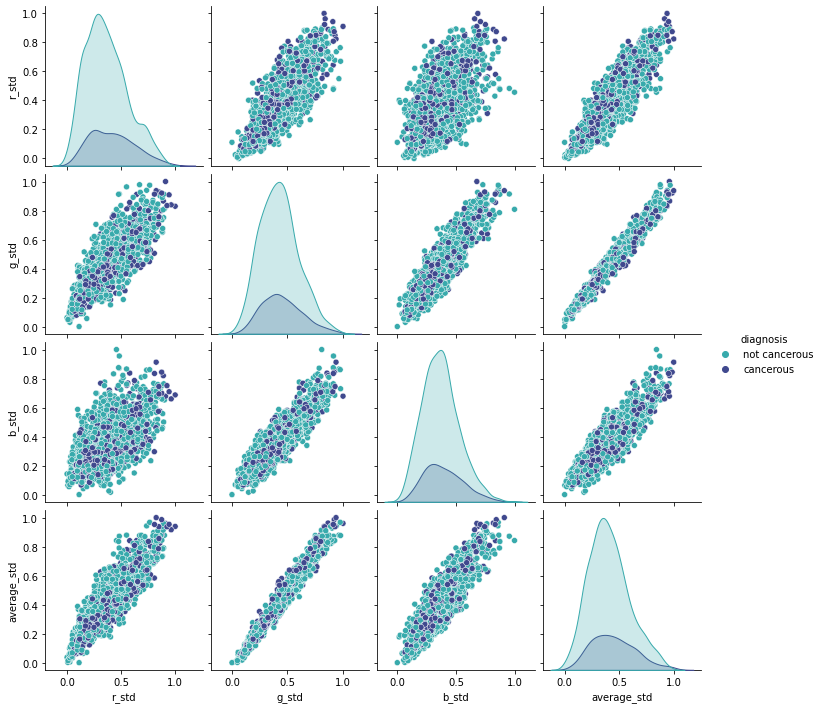

In [41]:
# Standard deviation
plotting = c_mes.iloc[:,0:9].drop(c_mes.columns[[1, 2, 3, 4]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

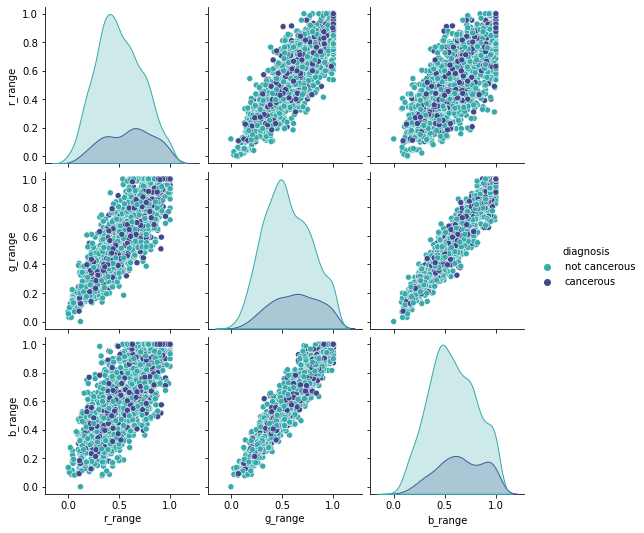

In [38]:
# Range
plotting = c_mes.iloc[:,0:12].drop(c_mes.columns[[1, 2, 3, 4, 5, 6, 7, 8]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

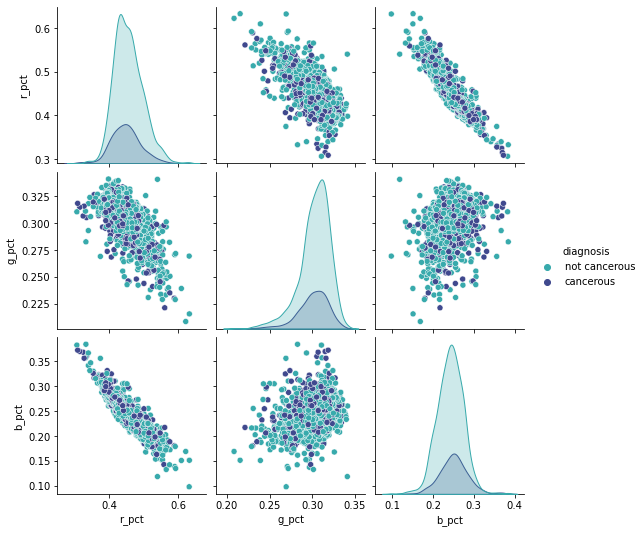

In [39]:
# Percentage
plotting = c_mes.iloc[:,0:15].drop(c_mes.columns[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")

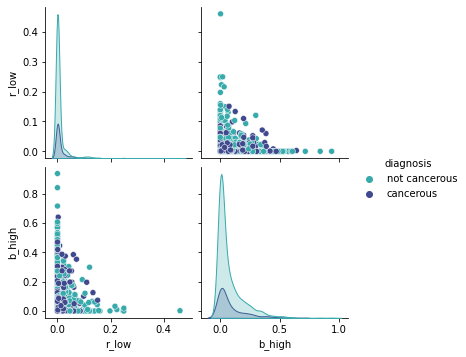

In [40]:
# Low r and high b
plotting = c_mes.iloc[:,0:17].drop(c_mes.columns[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]], axis=1)
sns.pairplot(plotting, hue='diagnosis', palette="mako_r")